# Reproducing Feldmann-Wustefel CDA Study (2018)

## Notes:

In [1]:
import numpy as np
import glob
import pickle

import mne
from mne import Epochs, pick_channels, find_events
from mne.io import read_raw_brainvision

import sys
sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Feldmann-Wustefeld-2018/')
from events import get_specific_events, get_epochs, get_CDA, prep_report, fill_report, get_report, checksum

from autoreject import AutoReject

import matplotlib.pyplot as plt
%matplotlib inline

## 1. Prep Data

In [2]:
#==================================================================
# General Variables
#==================================================================
triggers = dict();

triggers['1+3_same'] = [111, 112] 
triggers['2+2_same'] = [121, 122]
triggers['3+1_same'] = [131, 132]
triggers['1+3_diff'] = [141, 142] 
triggers['2+2_diff'] = [151, 152]
triggers['3+1_diff'] = [161, 162]

triggers['right'] = [111, 121, 131, 141, 151, 161]
triggers['left'] = [112, 122, 132, 142, 152, 162]

triggers['all'] = [111, 121, 131, 141, 151, 161, 112, 122, 132, 142, 152, 162]

# Good & Bad in Behav file! (no hardware trigger)
# --------------------------

# Labels
conds = ['1+3_same', '2+2_same', '3+1_same', '1+3_diff', '2+2_diff', '3+1_diff']
sides = ['left', 'right']
perfs = ['good', 'bad']

# CDA Channels
chan_right = ['PO8']
chan_left = ['PO7']

# Epochs information
epoch_length = 1.5
epoch_tmin = -0.2
baseline_corr = (-0.2, 0)

# CDA main variable!
cda_dict = dict()
cda_dict_clean = dict()
report = prep_report(conds, sides, perfs)
report_clean = prep_report(conds, sides, perfs)

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
directory_path = '/Users/nick/Documents/PhD/CDA Datasets/Feldmann-Westefel 2018/AnalysisPipeline/Experiment2/'

for filepath in glob.iglob(directory_path + 'rawEEG/' + '*.vhdr'):
    filename = filepath[filepath.rfind('/')+1:]
    print('Processing: ' + filename + '...')

    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_brainvision(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    preproc = raw

    # In their study they re-reference to average. I skipped it for now.

    # Filter
    preproc = preproc.filter(.1, 30., fir_design='firwin')
    
    events = mne.events_from_annotations(preproc)
    #preproc.plot(events=events, block=True, lowpass=40)

    # ------------------------
    # 3. -- Epochs --
    # ------------------------
    #====================================
    # 1. Load Behav file to get ACC (accuracy: good/bad trials)
    # 2. Find 'clean' trials and sort them by triggers.
    # 3. Epochs
    # 4. Remove Baseline
    #====================================
    subject_str_idx = filename.rfind('.')
    subject_id = filename[subject_str_idx - 2: subject_str_idx]
    
    specific_events = get_specific_events(events[0], conds, sides, perfs, triggers, subject_id, experiment=2)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr)

    # ------------------------
    # X. -- CLEANING! --
    # TODO: Stack toutes les epochs et clean them all at once, au lieu de genre 13 à la fois...
    # ------------------------
    ar = AutoReject()

    # Flatten epochs to clean all at once.
    epochs_dict_clean = dict()
    epochs_to_clean = []
    for c in epochs_dict.keys():
        epochs_dict_clean[c] = dict()
        for s in epochs_dict[c].keys():
            epochs_dict_clean[c][s] = dict()
            for p in ['good']:#epochs_dict[c][s].keys():
                epochs_dict_clean[c][s][p] = []
                epochs_to_clean.append(epochs_dict[c][s][p])

    len(epochs_to_clean)

    cleaned_epochs = ar.fit_transform(mne.concatenate_epochs(epochs_to_clean)) 

    # Reconstruct epochs                
    for cond in conds:
        for t in triggers[cond]:
            for side in sides:
                if t in triggers[side]:
                    cur_side = side

            epochs_dict_clean[cond][cur_side]['good'].append(cleaned_epochs[str(t)])

    # Concatenate Epochs into Epochs MNE structure (from a list of Epochs because of diff triggers)
    for cond in conds:
        for side in sides:
            epochs_dict_clean[cond][side]['good'] = mne.concatenate_epochs(epochs_dict_clean[cond][side]['good'])
            
            
    # ------------------------
    # 4. - Report & Checksum -
    # ------------------------
    report = fill_report(report, filename, specific_events)
    report.at[filename, 'checksum'] = checksum(specific_events, epochs_dict)
    
    report_clean = fill_report(report, filename, epochs_dict_clean)
    
    # ------------------------
    # 5. -- CDA --
    # ------------------------
    cda_dict[filename] = get_CDA(epochs_dict, conds, sides, perfs, chan_right, chan_left)
    cda_dict_clean[filename] = get_CDA(epochs_dict_clean, conds, sides, ['good'], chan_right, chan_left)

# Add time points to CDA for later use.
times = epochs_dict['3+1_diff']['left']['good'].times

# Print report
report

Processing: Hudson2_0015.vhdr...
Extracting parameters from /Users/nick/Documents/PhD/CDA Datasets/Feldmann-Westefel 2018/AnalysisPipeline/Experiment2/rawEEG/Hudson2_0015.vhdr...
Setting channel info structure...
Reading 0 ... 5054619  =      0.000 ...  5054.619 secs...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 62 events and 1701 original time points ...







Estimated consensus=0.30 and n_interpolate=4



Dropped 47 epochs: 6, 39, 40, 77, 82, 93, 102, 118, 146, 150, 157, 170, 207, 210, 245, 274, 295, 317, 347, 354, 368, 406, 412, 413, 428, 443, 489, 490, 507, 508, 534, 546, 558, 573, 574, 636, 658, 660, 663, 666, 671, 675, 677, 698, 699, 700, 703
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
65 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 71 events and 1701 origina







Estimated consensus=0.60 and n_interpolate=1



Dropped 14 epochs: 113, 254, 354, 395, 505, 552, 611, 629, 637, 705, 745, 753, 843, 848
Not setting metadata
Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
67 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
74 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
74 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
N

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 1086 | Total Added: 1086 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
75 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 75 events and 1701 origi

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(








Estimated consensus=0.50 and n_interpolate=4



Dropped 32 epochs: 10, 38, 53, 120, 121, 203, 251, 272, 291, 371, 372, 407, 426, 440, 442, 514, 530, 532, 560, 586, 591, 597, 604, 615, 663, 676, 685, 809, 817, 834, 890, 898
Not setting metadata
Not setting metadata
72 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
76 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
76 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
74 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
74

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 62 events and 1701 original time points ...







Estimated consensus=0.40 and n_interpolate=1



Dropped 21 epochs: 26, 47, 166, 170, 195, 220, 377, 388, 412, 433, 446, 496, 508, 546, 569, 583, 661, 662, 686, 787, 802
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
73 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
68 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
68 matching events found
Applying baseline correction (m

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 61 events and 1701 original time points ...







Estimated consensus=0.70 and n_interpolate=1



Dropped 7 epochs: 18, 104, 128, 216, 331, 495, 515
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
52 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
52 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
65 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
55 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metad

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 60 events and 1701 origina







Estimated consensus=0.80 and n_interpolate=4



Dropped 18 epochs: 21, 163, 167, 238, 288, 307, 356, 371, 422, 468, 482, 515, 534, 592, 626, 688, 692, 733
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
67 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 b

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 63 events and 1701 origina







Estimated consensus=0.70 and n_interpolate=4



Dropped 4 epochs: 35, 275, 513, 596
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
52 matching

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 61 events and 1701 origina







Estimated consensus=0.70 and n_interpolate=4



Dropped 1 epoch: 420
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
65 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
A

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 56 events and 1701 original time points ...







Estimated consensus=0.80 and n_interpolate=1



Dropped 4 epochs: 269, 295, 314, 399
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
54 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
55 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
47 matchin

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 60 events and 1701 origina







Estimated consensus=0.80 and n_interpolate=4



Dropped 4 epochs: 46, 399, 505, 510
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
66 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
67 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
69 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
67 matching

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 59 events and 1701 original time points ...

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(








Estimated consensus=0.70 and n_interpolate=1



Dropped 81 epochs: 2, 6, 8, 10, 43, 47, 56, 59, 65, 67, 119, 120, 136, 171, 172, 174, 175, 181, 190, 196, 211, 230, 231, 232, 238, 240, 246, 250, 274, 275, 290, 291, 292, 299, 343, 349, 353, 354, 355, 356, 360, 377, 398, 403, 413, 421, 425, 426, 428, 429, 450, 460, 469, 480, 481, 482, 483, 484, 485, 489, 521, 526, 536, 539, 597, 598, 599, 602, 605, 610, 626, 629, 634, 662, 664, 667, 668, 669, 676, 679, 706
Not setting metadata
Not setting metadata
52 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
49 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
51 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
50 matching events found
Ap

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 56 events and 1701 original time points ...







Estimated consensus=0.60 and n_interpolate=1



Dropped 28 epochs: 21, 30, 58, 94, 101, 109, 117, 203, 227, 240, 276, 299, 322, 334, 339, 366, 399, 433, 455, 477, 500, 574, 588, 614, 646, 682, 683, 714
Not setting metadata
Not setting metadata
54 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events foun

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 63 events and 1701 original time points ...







Estimated consensus=0.30 and n_interpolate=1



Dropped 51 epochs: 11, 27, 29, 76, 80, 91, 96, 135, 141, 143, 147, 153, 163, 198, 223, 224, 257, 271, 286, 287, 292, 295, 299, 344, 345, 346, 350, 398, 406, 413, 415, 443, 464, 466, 467, 476, 502, 516, 541, 595, 597, 606, 647, 650, 653, 661, 666, 728, 735, 736, 765
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
66 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
54 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baselin

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 63 events and 1701 origina







Estimated consensus=1.00 and n_interpolate=30



No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 56 events and 1701 original time points ...







Estimated consensus=0.80 and n_interpolate=4



Dropped 9 epochs: 22, 80, 101, 120, 203, 245, 310, 506, 516
Not setting metadata
Not setting metadata
55 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
49 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
49 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
56 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not sett

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
65 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 65 events and 1701 original time points ...







Estimated consensus=0.60 and n_interpolate=1



Dropped 5 epochs: 315, 412, 560, 593, 659
Not setting metadata
Not setting metadata
65 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
66 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
63 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
59 ma

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
50 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 50 events and 1701 original time points ...







Estimated consensus=0.20 and n_interpolate=1



Dropped 132 epochs: 2, 4, 5, 15, 17, 21, 22, 25, 28, 29, 33, 44, 46, 53, 54, 61, 62, 64, 68, 73, 77, 79, 81, 85, 86, 88, 90, 91, 97, 115, 120, 125, 129, 130, 133, 140, 141, 147, 148, 163, 177, 184, 199, 207, 229, 230, 235, 249, 252, 254, 256, 258, 263, 265, 267, 269, 271, 281, 282, 289, 292, 297, 312, 315, 332, 338, 339, 345, 354, 355, 358, 368, 372, 373, 382, 387, 389, 397, 401, 407, 422, 435, 441, 454, 456, 459, 463, 464, 465, 467, 478, 479, 485, 488, 504, 508, 516, 520, 531, 535, 539, 540, 542, 545, 547, 549, 557, 558, 559, 560, 565, 570, 571, 572, 577, 580, 584, 587, 595, 596, 598, 612, 621, 626, 628, 635, 641, 643, 648, 657, 665, 666
Not setting metadata
Not setting metadata
37 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
45 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
48 matching events found
Applying baseline correct

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
67 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 67 events and 1701 original time points ...







Estimated consensus=0.10 and n_interpolate=1



Dropped 298 epochs: 2, 6, 11, 22, 23, 25, 26, 29, 33, 35, 36, 38, 40, 42, 43, 51, 52, 53, 56, 57, 59, 60, 61, 62, 66, 69, 73, 76, 81, 85, 88, 89, 92, 94, 98, 100, 101, 102, 104, 110, 115, 116, 118, 119, 122, 123, 125, 127, 129, 132, 134, 138, 140, 142, 154, 156, 159, 160, 161, 163, 165, 166, 171, 172, 173, 176, 177, 181, 182, 184, 185, 187, 188, 189, 191, 194, 195, 196, 197, 198, 199, 200, 201, 211, 214, 219, 221, 226, 227, 233, 237, 238, 242, 247, 251, 254, 257, 258, 263, 265, 266, 271, 272, 284, 288, 291, 293, 295, 298, 300, 306, 307, 308, 309, 318, 320, 321, 326, 329, 330, 331, 332, 333, 335, 337, 340, 344, 350, 353, 357, 362, 363, 368, 370, 372, 373, 375, 376, 377, 378, 386, 387, 393, 394, 395, 397, 398, 401, 411, 413, 414, 415, 424, 426, 431, 432, 435, 436, 438, 439, 447, 449, 453, 458, 459, 460, 461, 462, 463, 466, 473, 477, 479, 484, 487, 490, 495, 496, 499, 502, 504, 505, 506, 510, 512, 513, 514, 519, 520, 522, 526, 528, 530, 531, 532, 534, 535, 555, 557, 559, 568, 570, 571, 5

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
67 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 67 events and 1701 origina







Estimated consensus=0.30 and n_interpolate=1



Dropped 45 epochs: 2, 15, 46, 52, 58, 74, 78, 86, 96, 111, 119, 126, 132, 154, 157, 167, 168, 193, 261, 306, 336, 368, 373, 384, 403, 474, 535, 536, 549, 571, 578, 582, 628, 630, 658, 666, 670, 677, 680, 687, 688, 703, 735, 767, 775
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
64 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
57 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
58 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
62 matching events found
Applying baseline correction (mode: mean)
0 bad e

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1695958224.py:53: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 33', 'Stimulus/S 51', 'Stimulus/S 52', 'Stimulus/S 66', 'Stimulus/S 99', 'Stimulus/S111', 'Stimulus/S112', 'Stimulus/S116', 'Stimulus/S117', 'Stimulus/S121', 'Stimulus/S122', 'Stimulus/S126', 'Stimulus/S127', 'Stimulus/S131', 'Stimulus/S132', 'Stimulus/S136', 'Stimulus/S137', 'Stimulus/S141', 'Stimulus/S142', 'Stimulus/S146', 'Stimulus/S147', 'Stimulus/S151', 'Stimulus/S152', 'Stimulus/S156', 'Stimulus/S157', 'Stimulus/S161', 'Stimulus/S162', 'Stimulus/S166', 'Stimulus/S167']
Nb Trials: 960 | Total Added: 960 | Total Skipped: 0 
====================== EPOCHING ======================
tmin:-0.2, tmax:1.5, baseline=(-0.2, 0)
---------- 1+3_same-left-good -------------
Not setting metadata
Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 60 events and 1701 origina







Estimated consensus=0.10 and n_interpolate=1



Dropped 169 epochs: 0, 6, 10, 14, 15, 21, 24, 25, 26, 32, 34, 35, 36, 39, 42, 51, 59, 67, 74, 77, 79, 86, 89, 92, 93, 94, 96, 97, 110, 121, 128, 129, 134, 136, 142, 143, 144, 146, 147, 150, 152, 154, 156, 157, 162, 182, 189, 197, 198, 200, 201, 202, 203, 204, 208, 209, 213, 214, 218, 221, 223, 227, 228, 234, 255, 260, 264, 267, 273, 275, 276, 279, 282, 283, 289, 290, 305, 306, 318, 327, 331, 337, 343, 344, 345, 351, 352, 354, 377, 382, 390, 393, 398, 399, 405, 406, 409, 410, 413, 418, 422, 425, 426, 429, 438, 440, 447, 458, 463, 475, 476, 479, 489, 491, 492, 498, 525, 526, 534, 535, 536, 543, 546, 554, 555, 556, 558, 559, 569, 576, 577, 603, 604, 610, 612, 613, 614, 618, 619, 627, 630, 631, 632, 633, 640, 662, 663, 667, 671, 687, 691, 693, 701, 702, 703, 708, 718, 727, 741, 742, 746, 747, 749, 753, 755, 761, 763, 770, 789
Not setting metadata
Not setting metadata
43 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting me

,1+3_same,2+2_same,3+1_same,1+3_diff,2+2_diff,3+1_diff,left,right,good,bad,...,3+1_diff-left,3+1_diff-left-good,3+1_diff-good,3+1_diff-left-bad,3+1_diff-bad,3+1_diff-right,3+1_diff-right-good,3+1_diff-right-bad,checksum,notes
Hudson2_0015.vhdr,160,160,160,160,160,160,480,480,748,212,...,80,52,112,28,48,80,60,20,1,
Hudson2_0023.vhdr,160,160,160,160,160,160,480,480,858,102,...,80,71,137,9,23,80,66,14,1,
Hudson2_0019.vhdr,180,183,179,182,181,181,542,544,918,168,...,91,72,151,19,30,90,79,11,1,
Hudson2_0018.vhdr,160,160,160,160,160,160,480,480,816,144,...,80,65,127,15,33,80,62,18,1,
Hudson2_0022.vhdr,160,160,160,160,160,160,480,480,680,280,...,80,52,110,28,50,80,58,22,1,
Hudson2_0014.vhdr,160,160,160,160,160,160,480,480,755,205,...,80,69,128,11,32,80,59,21,1,
Hudson2_0025.vhdr,160,160,160,160,160,160,480,480,721,239,...,80,58,120,22,40,80,62,18,1,
Hudson2_0029.vhdr,160,160,160,160,160,160,480,480,737,223,...,80,59,122,21,38,80,63,17,1,
Hudson2_0013.vhdr,160,160,160,160,160,160,480,480,661,299,...,80,56,108,24,52,80,52,28,1,
Hudson2_0012.vhdr,160,160,160,160,160,160,480,480,774,186,...,80,64,133,16,27,80,69,11,1,


In [3]:
report

,1+3_same,2+2_same,3+1_same,1+3_diff,2+2_diff,3+1_diff,left,right,good,bad,...,3+1_diff-left,3+1_diff-left-good,3+1_diff-good,3+1_diff-left-bad,3+1_diff-bad,3+1_diff-right,3+1_diff-right-good,3+1_diff-right-bad,checksum,notes
Hudson2_0015.vhdr,160,160,160,160,160,160,480,480,748,212,...,80,52,112,28,48,80,60,20,1,
Hudson2_0023.vhdr,160,160,160,160,160,160,480,480,858,102,...,80,71,137,9,23,80,66,14,1,
Hudson2_0019.vhdr,180,183,179,182,181,181,542,544,918,168,...,91,72,151,19,30,90,79,11,1,
Hudson2_0018.vhdr,160,160,160,160,160,160,480,480,816,144,...,80,65,127,15,33,80,62,18,1,
Hudson2_0022.vhdr,160,160,160,160,160,160,480,480,680,280,...,80,52,110,28,50,80,58,22,1,
Hudson2_0014.vhdr,160,160,160,160,160,160,480,480,755,205,...,80,69,128,11,32,80,59,21,1,
Hudson2_0025.vhdr,160,160,160,160,160,160,480,480,721,239,...,80,58,120,22,40,80,62,18,1,
Hudson2_0029.vhdr,160,160,160,160,160,160,480,480,737,223,...,80,59,122,21,38,80,63,17,1,
Hudson2_0013.vhdr,160,160,160,160,160,160,480,480,661,299,...,80,56,108,24,52,80,52,28,1,
Hudson2_0012.vhdr,160,160,160,160,160,160,480,480,774,186,...,80,64,133,16,27,80,69,11,1,


In [4]:
report_clean

,1+3_same,2+2_same,3+1_same,1+3_diff,2+2_diff,3+1_diff,left,right,good,bad,...,3+1_diff-left,3+1_diff-left-good,3+1_diff-good,3+1_diff-left-bad,3+1_diff-bad,3+1_diff-right,3+1_diff-right-good,3+1_diff-right-bad,checksum,notes
Hudson2_0015.vhdr,160,160,160,160,160,160,480,480,748,212,...,80,52,112,28,48,80,60,20,1,
Hudson2_0023.vhdr,160,160,160,160,160,160,480,480,858,102,...,80,71,137,9,23,80,66,14,1,
Hudson2_0019.vhdr,180,183,179,182,181,181,542,544,918,168,...,91,72,151,19,30,90,79,11,1,
Hudson2_0018.vhdr,160,160,160,160,160,160,480,480,816,144,...,80,65,127,15,33,80,62,18,1,
Hudson2_0022.vhdr,160,160,160,160,160,160,480,480,680,280,...,80,52,110,28,50,80,58,22,1,
Hudson2_0014.vhdr,160,160,160,160,160,160,480,480,755,205,...,80,69,128,11,32,80,59,21,1,
Hudson2_0025.vhdr,160,160,160,160,160,160,480,480,721,239,...,80,58,120,22,40,80,62,18,1,
Hudson2_0029.vhdr,160,160,160,160,160,160,480,480,737,223,...,80,59,122,21,38,80,63,17,1,
Hudson2_0013.vhdr,160,160,160,160,160,160,480,480,661,299,...,80,56,108,24,52,80,52,28,1,
Hudson2_0012.vhdr,160,160,160,160,160,160,480,480,774,186,...,80,64,133,16,27,80,69,11,1,


## Raw

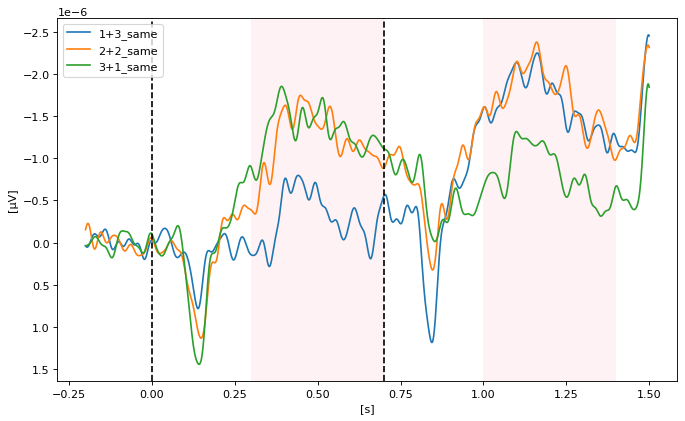

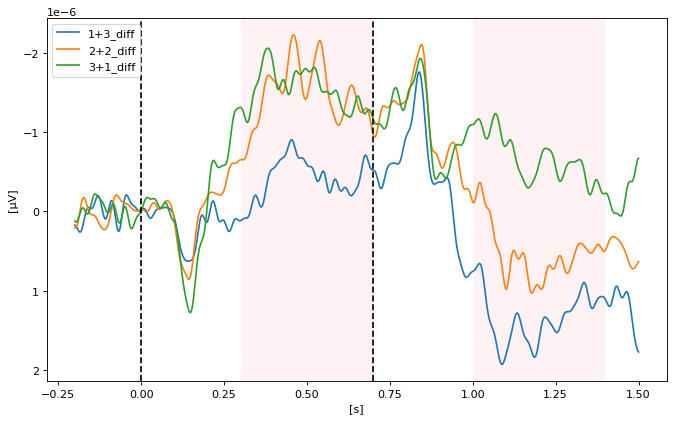

In [5]:
# 1. Get Grand Average CDA (across subjects)
cda_all = dict()
for cond in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict.keys():
        if len(cda_dict[f][cond]['left']['good']) > 0:
            cda_dict_cur = (cda_dict[f][cond]['left']['good'] + cda_dict[f][cond]['right']['good'])/2
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
            
# 2. Plot Figure #1
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all['1+3_same'].mean(0), label='1+3_same')
plt.plot(times, cda_all['2+2_same'].mean(0), label='2+2_same')
plt.plot(times, cda_all['3+1_same'].mean(0), label='3+1_same')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

# 2. Plot Figure #2
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all['1+3_diff'].mean(0), label='1+3_diff')
plt.plot(times, cda_all['2+2_diff'].mean(0), label='2+2_diff')
plt.plot(times, cda_all['3+1_diff'].mean(0), label='3+1_diff')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

## Clean

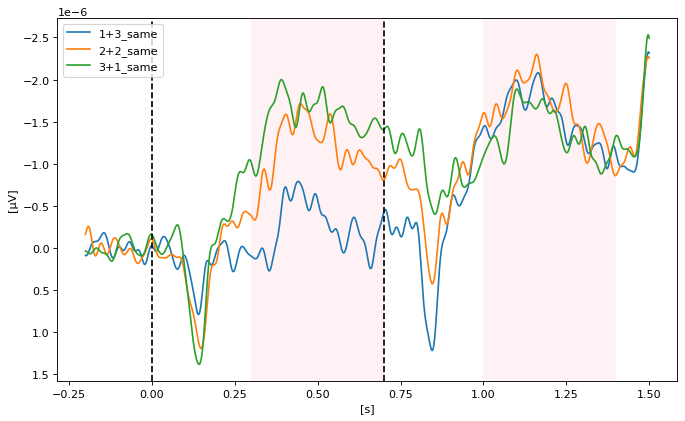

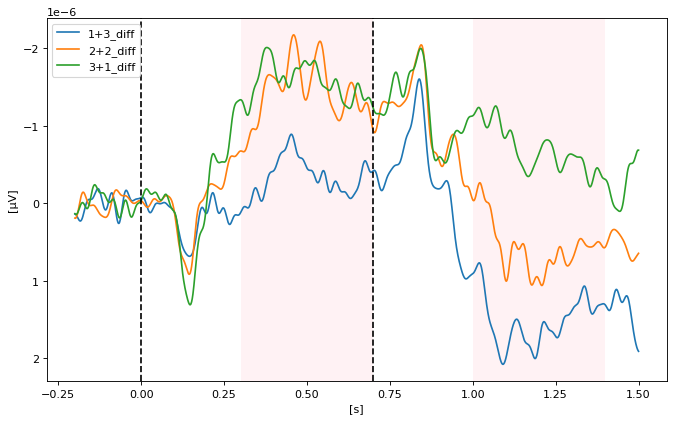

In [6]:
# 1. Get Grand Average CDA (across subjects)
cda_all = dict()
for cond in cda_dict[list(cda_dict_clean.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict_clean.keys():
        perf = 'good'
        ldict = cda_dict_clean[f][cond]['left']
        rdict = cda_dict_clean[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][cond]['left'][perf] + cda_dict_clean[f][cond]['right'][perf])/2 
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
            
# 2. Plot Figure #1
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all['1+3_same'].mean(0), label='1+3_same')
plt.plot(times, cda_all['2+2_same'].mean(0), label='2+2_same')
plt.plot(times, cda_all['3+1_same'].mean(0), label='3+1_same')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

# 2. Plot Figure #2
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all['1+3_diff'].mean(0), label='1+3_diff')
plt.plot(times, cda_all['2+2_diff'].mean(0), label='2+2_diff')
plt.plot(times, cda_all['3+1_diff'].mean(0), label='3+1_diff')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

# Comparison

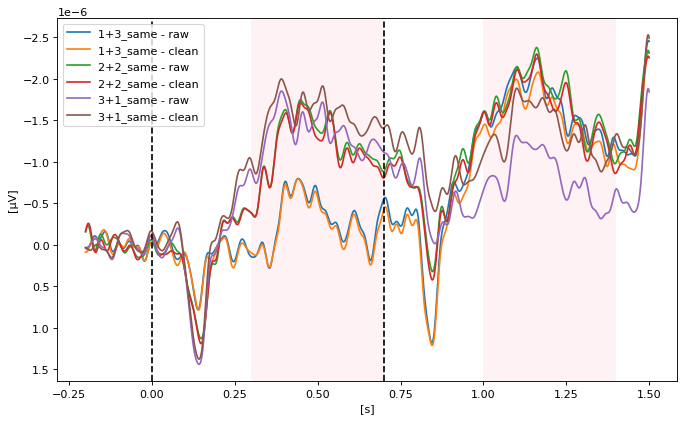

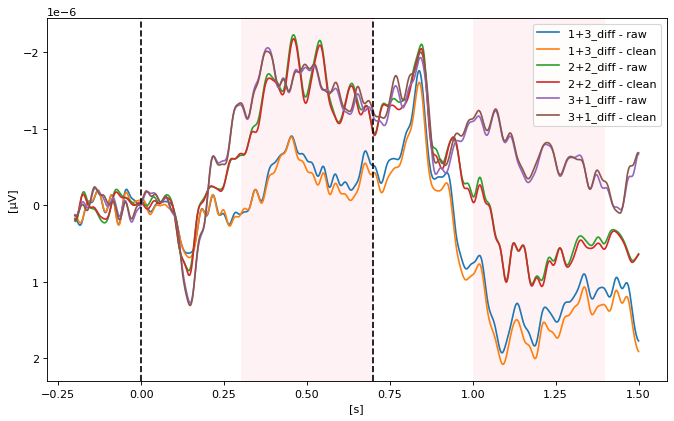

In [7]:
# 1. Get Grand Average CDA (across subjects)
cda_all_clean = dict()
for cond in cda_dict[list(cda_dict_clean.keys())[0]].keys():
    cda_all_clean[cond] = dict()

    for f in cda_dict_clean.keys():
        perf = 'good'
        ldict = cda_dict_clean[f][cond]['left']
        rdict = cda_dict_clean[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][cond]['left'][perf] + cda_dict_clean[f][cond]['right'][perf])/2 
            cda_all_clean[cond] = np.vstack([cda_all_clean[cond], cda_dict_cur]) if len(cda_all_clean[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))

cda_all_raw = dict()
for cond in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all_raw[cond] = dict()

    for f in cda_dict.keys():
        perf = 'good'
        ldict = cda_dict[f][cond]['left']
        rdict = cda_dict[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict[f][cond]['left'][perf] + cda_dict[f][cond]['right'][perf])/2 
            cda_all_raw[cond] = np.vstack([cda_all_raw[cond], cda_dict_cur]) if len(cda_all_raw[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
            
# 2. Plot Figure #1
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all_raw['1+3_same'].mean(0), label='1+3_same - raw')
plt.plot(times, cda_all_clean['1+3_same'].mean(0), label='1+3_same - clean')
plt.plot(times, cda_all_raw['2+2_same'].mean(0), label='2+2_same - raw')
plt.plot(times, cda_all_clean['2+2_same'].mean(0), label='2+2_same - clean')
plt.plot(times, cda_all_raw['3+1_same'].mean(0), label='3+1_same - raw')
plt.plot(times, cda_all_clean['3+1_same'].mean(0), label='3+1_same - clean')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

# 2. Plot Figure #2
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(times, cda_all_raw['1+3_diff'].mean(0), label='1+3_diff - raw')
plt.plot(times, cda_all_clean['1+3_diff'].mean(0), label='1+3_diff - clean')
plt.plot(times, cda_all_raw['2+2_diff'].mean(0), label='2+2_diff - raw')
plt.plot(times, cda_all_clean['2+2_diff'].mean(0), label='2+2_diff - clean')
plt.plot(times, cda_all_raw['3+1_diff'].mean(0), label='3+1_diff - raw')
plt.plot(times, cda_all_clean['3+1_diff'].mean(0), label='3+1_diff - clean')
plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
plt.axvline(x=0, color='k', linestyle='--')
plt.axvline(x=0.7, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')
plt.show()

# Exploration

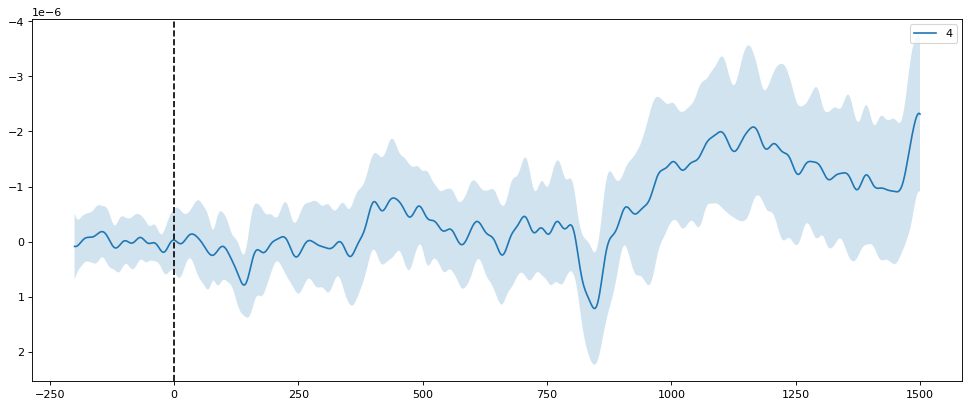

In [8]:
plt.figure(figsize=(15, 6), dpi=80)
means = cda_all['1+3_same'].mean(0)
stds = cda_all['1+3_same'].std(0)
plt.plot((times * 1000), means, label='4')
plt.fill_between((times * 1000), means-stds,means+stds,alpha=.2)

plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.show()

# CDA Raw vs Clean per Subject

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_6004/1815678053.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(15,15))


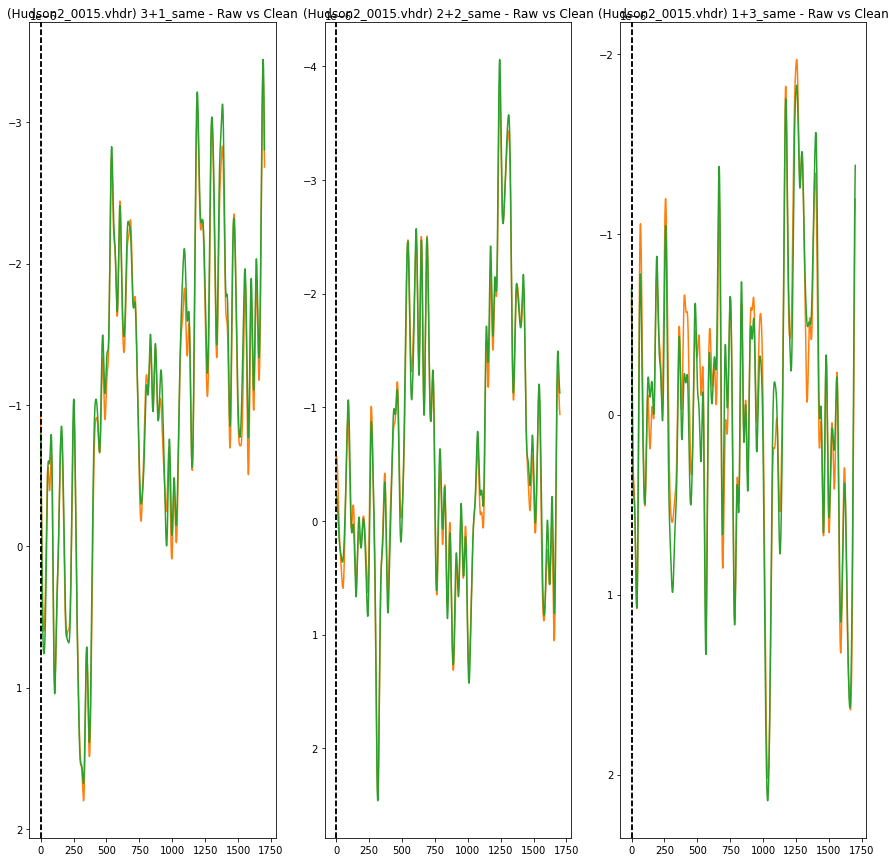

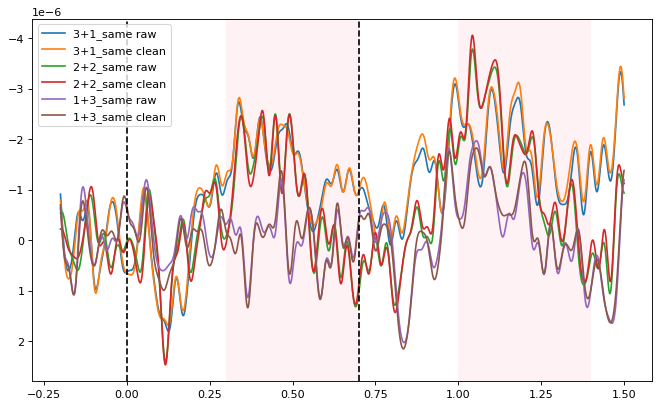

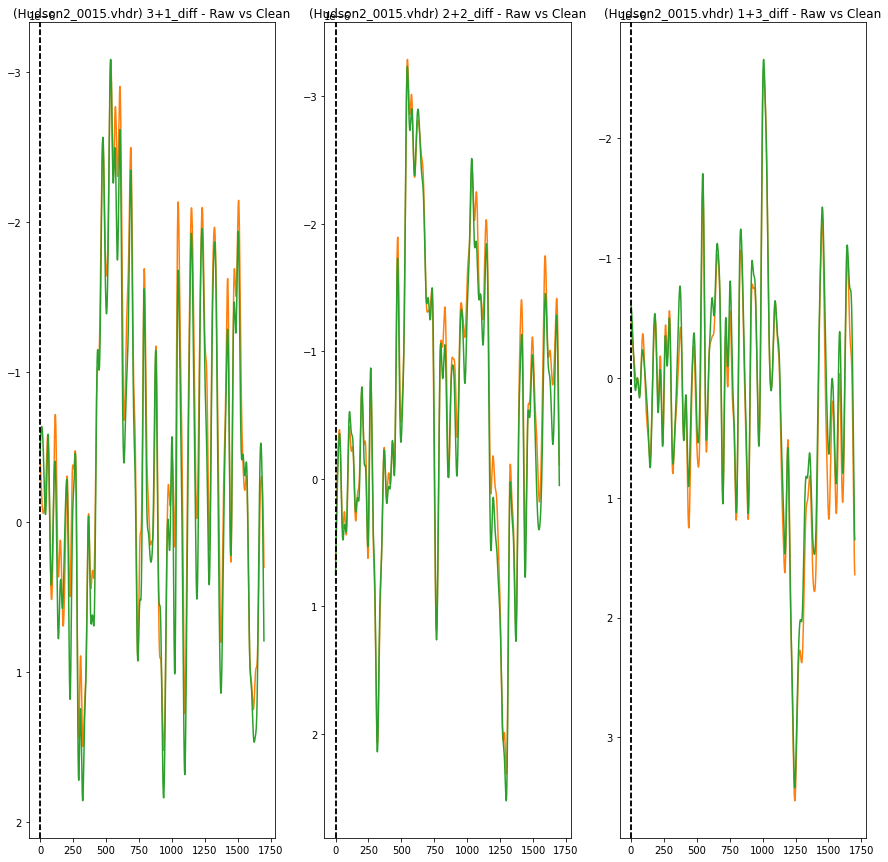

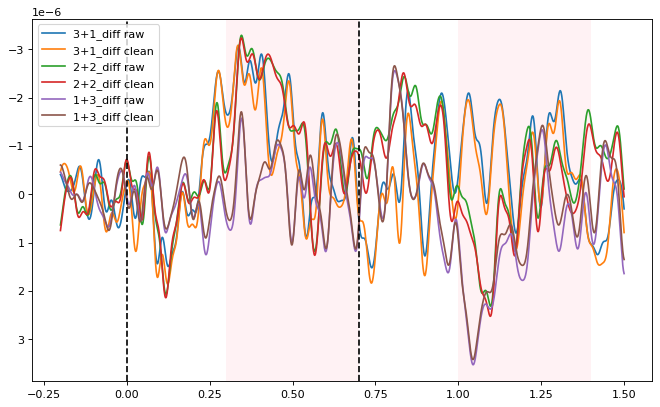

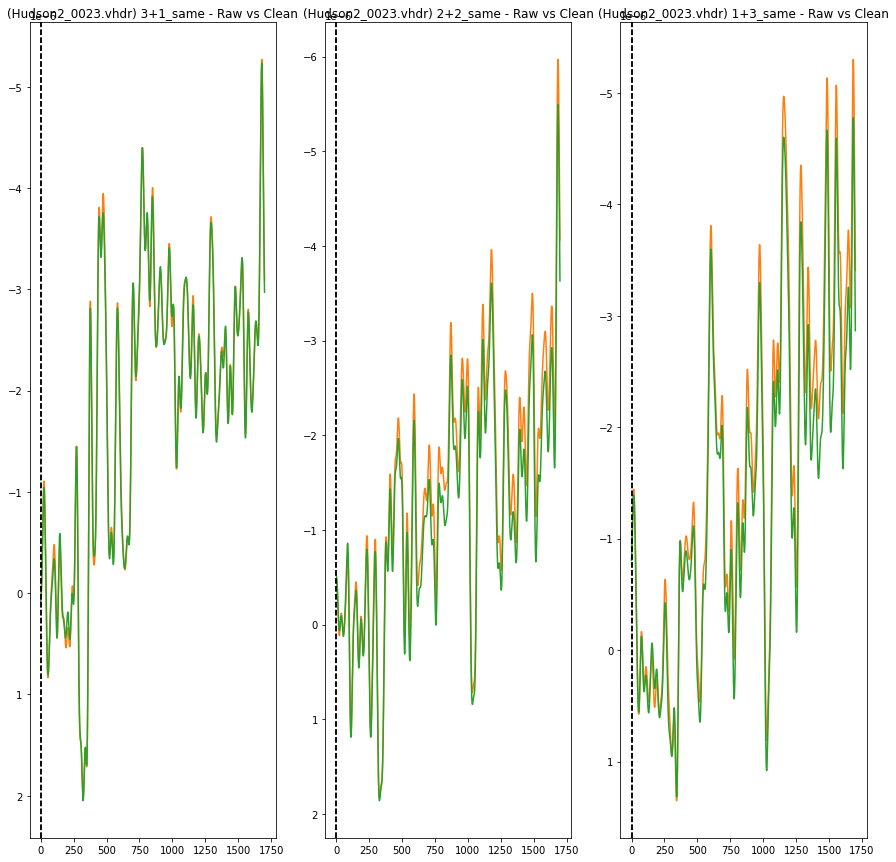

...

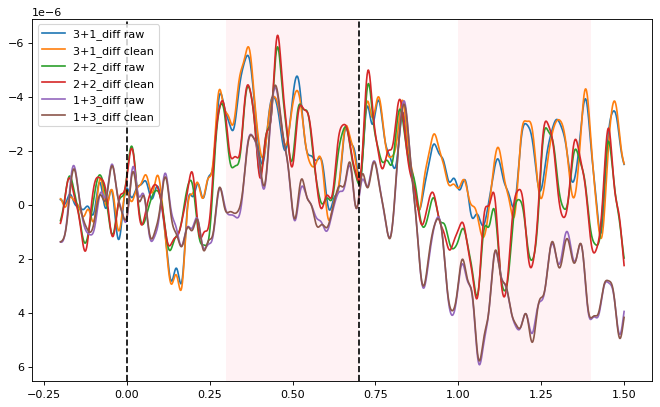

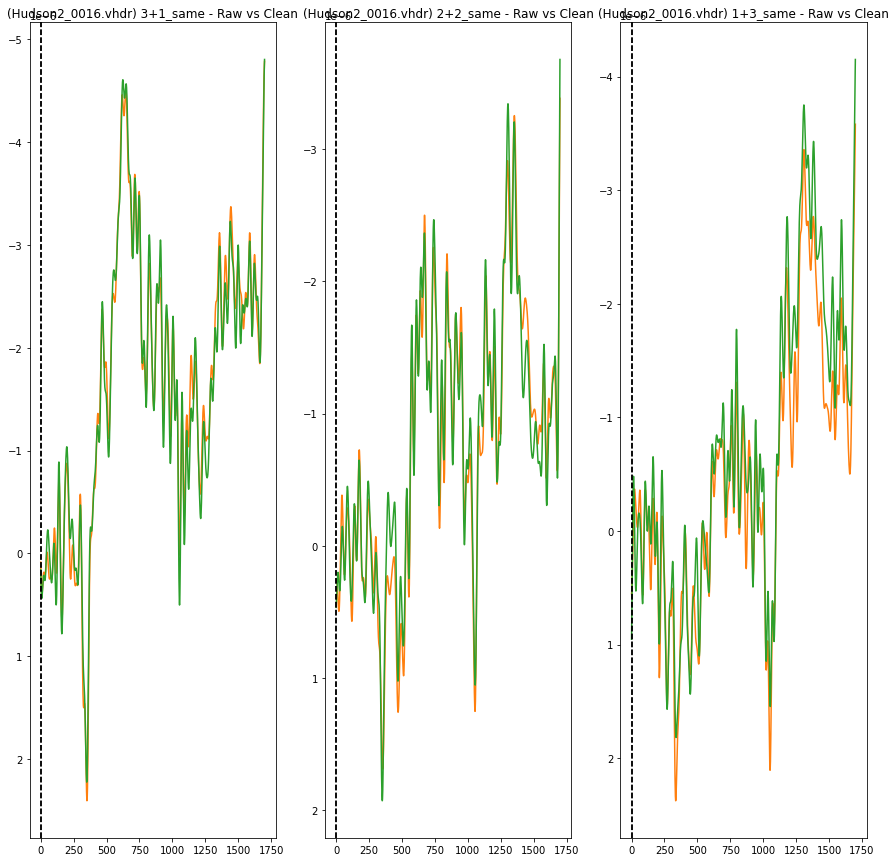

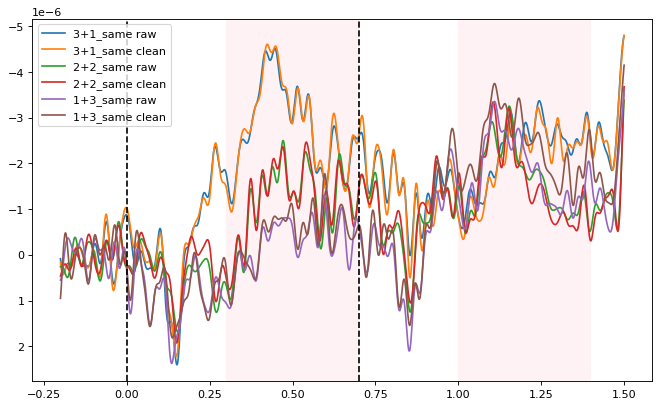

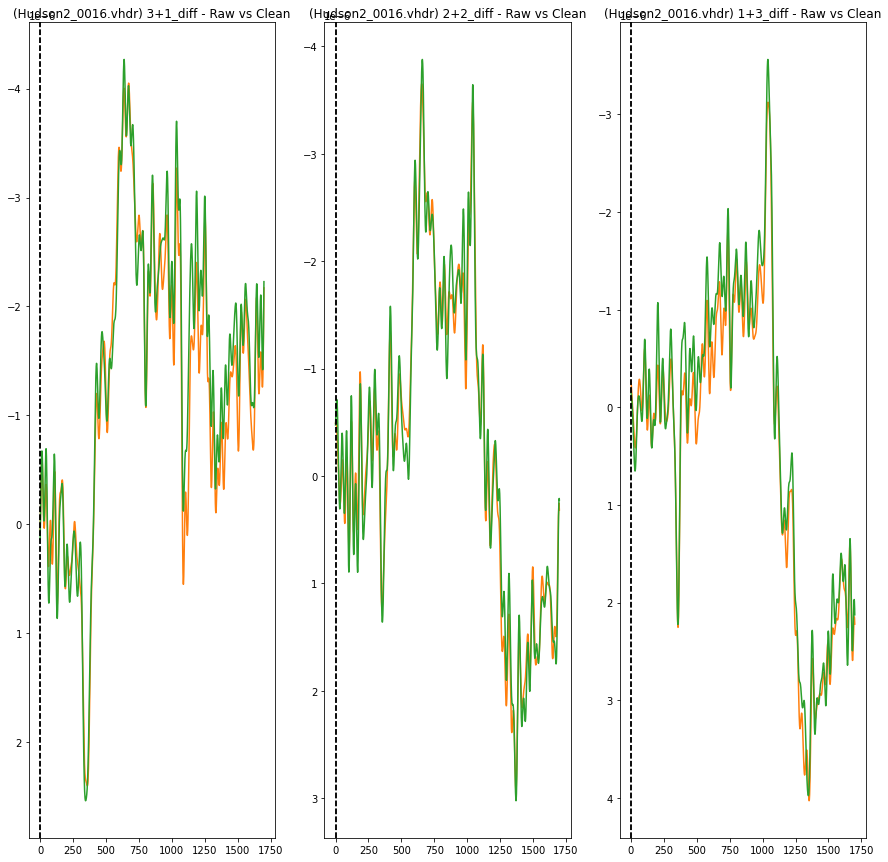

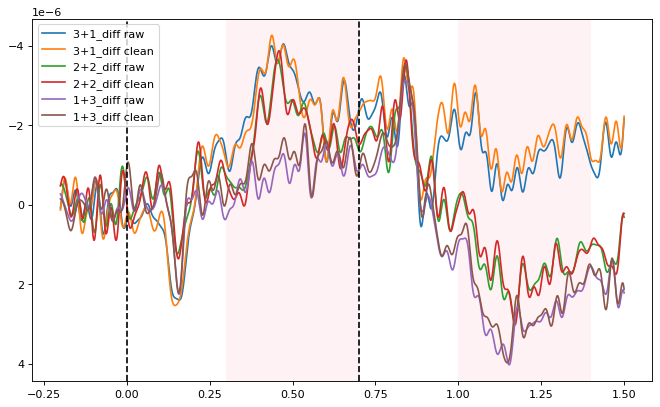

In [11]:
cda_raw = dict()
cda_clean = dict()

# perf = 'good'
for f in cda_dict_clean.keys():
    for c2 in ['same', 'diff']:
        fig, axs = plt.subplots(1, 3, figsize=(15,15))
        for i, c1 in enumerate(['3+1', '2+2', '1+3']):
            c = '{}_{}'.format(c1, c2)
            
            # Raw
            ldict = cda_dict[f][c]['left']
            rdict = cda_dict[f][c]['right']
            if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
                cda_dict_cur = (cda_dict[f][c]['left'][perf] + cda_dict[f][c]['right'][perf])/2
            else:
                cda_dict_cur = 0

            axs[i].plot(cda_dict_cur, 'tab:orange')

            cda_raw[c] = cda_dict_cur
            
            # Clean
            ldict = cda_dict_clean[f][c]['left']
            rdict = cda_dict_clean[f][c]['right']
            if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
                cda_dict_cur = (cda_dict_clean[f][c]['left'][perf] + cda_dict_clean[f][c]['right'][perf])/2
            else:
                cda_dict_cur = 0

            axs[i].plot(cda_dict_cur, 'tab:green')
            
            axs[i].set_title('({}) {} - Raw vs Clean'.format(f, c))
            axs[i].axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
            axs[i].axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
            axs[i].axvline(x=0, color='k', linestyle='--')
            axs[i].axvline(x=0.7, color='k', linestyle='--')
            axs[i].invert_yaxis()
            
            cda_clean[c] = cda_dict_cur
            
        plt.figure(figsize=(10, 6), dpi=80)
        for c1 in ['3+1', '2+2', '1+3']:
            c = '{}_{}'.format(c1, c2)
            plt.plot(times, cda_raw[c], label='{} {}'.format(c, 'raw'))
            plt.plot(times, cda_clean[c], label='{} {}'.format(c, 'clean'))
            
        plt.axvspan(0.3, 0.7, facecolor='pink', edgecolor='none', alpha=.2)
        plt.axvspan(1, 1.4, facecolor='pink', edgecolor='none', alpha=.2)
        plt.axvline(x=0, color='k', linestyle='--')
        plt.axvline(x=0.7, color='k', linestyle='--')
        plt.gca().invert_yaxis()
        plt.legend()
    